## Initialize HOME Path

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

## Install Necessary Packages

In [2]:
%pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5689.3/8062.4 GB disk)


In [3]:
from ultralytics import YOLO

from IPython.display import display, Image

## Initialize Dataset and Paths

In [4]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="o7BFDC8TDMsRax8RUnWi")
project = rf.workspace("cardamagedetectionall-vxdcu").project("try-balance-data")
version = project.version(1)
dataset = version.download("yolov8")

/kaggle/working/datasets
Reason for being yanked: deprecated, use 4.8.0.76
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 1.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 31.3 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.10.0.82
    Uninstalling opencv-python-headless-4.10.0.82:
      Successfully uninstalled opencv-python-headless-4.10.0.82
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cy


Extracting Dataset Version Zip to try-balance-data-1 in yolov8:: 100%|██████████| 7384/7384 [00:01<00:00, 5742.78it/s]


In [5]:
# Change content data.yaml file to adjust the train, valid, and test folder path

import yaml

# Define the new content
# Note: adjust the train, valid, and test path according to your directory
new_content = {
    'names': [
        'bonnet_dent', 'bumper_dent', 'bumper_scratch', 'car_window_damage', 'crack',
        'door_dent', 'door_scratch', 'front_windscreen_damage', 'headlight_damage',
        'quarter_panel_dent', 'quarter_panel_scratch', 'rear_windscreen_damage',
        'taillight_damage', 'tire_flat', 'trunk_door_dent'
    ],
    'nc': 15,
    'roboflow': {
        'license': 'CC BY 4.0',
        'project': 'car-damage-detect-nttax',
        'url': 'https://universe.roboflow.com/cardamagedetectionall/car-damage-detect-nttax/dataset/1',
        'version': 1,
        'workspace': 'cardamagedetectionall'
    },
    'test': f'{dataset.location}/test/images',
    'train': f'{dataset.location}/train/images',
    'val': f'{dataset.location}/valid/images'
}

# Path to the data.yaml file
file_path = f'{dataset.location}/data.yaml'

# Read the original content
with open(file_path, 'r') as file:
    content = yaml.safe_load(file)

# Update the content with new values
content.update(new_content)

# Write the updated content back to the file
with open(file_path, 'w') as file:
    yaml.safe_dump(content, file)

print(f"data.yaml file has been updated successfully at {file_path}.")

data.yaml file has been updated successfully at /kaggle/working/datasets/try-balance-data-1/data.yaml.


In [6]:
# Check the content of data.yaml file
!cat {dataset.location}/data.yaml

names:
- bonnet_dent
- bumper_dent
- bumper_scratch
- car_window_damage
- crack
- door_dent
- door_scratch
- front_windscreen_damage
- headlight_damage
- quarter_panel_dent
- quarter_panel_scratch
- rear_windscreen_damage
- taillight_damage
- tire_flat
- trunk_door_dent
nc: 15
roboflow:
  license: CC BY 4.0
  project: car-damage-detect-nttax
  url: https://universe.roboflow.com/cardamagedetectionall/car-damage-detect-nttax/dataset/1
  version: 1
  workspace: cardamagedetectionall
test: /kaggle/working/datasets/try-balance-data-1/test/images
train: /kaggle/working/datasets/try-balance-data-1/train/images
val: /kaggle/working/datasets/try-balance-data-1/valid/images


## Training Model with Custom Dataset

In [7]:
%cd {HOME}

!yolo task=segment mode=train model=yolov8s-seg.pt data={dataset.location}/data.yaml epochs=200 imgsz=640

/kaggle/working
100%|███████████████████████████████████████| 22.8M/22.8M [00:00<00:00, 153MB/s]
Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/kaggle/working/datasets/try-balance-data-1/data.yaml, epochs=200, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fal

In [8]:
!ls {HOME}/runs/segment/train/

BoxF1_curve.png					   results.png
BoxPR_curve.png					   train_batch0.jpg
BoxP_curve.png					   train_batch1.jpg
BoxR_curve.png					   train_batch2.jpg
MaskF1_curve.png				   train_batch35150.jpg
MaskPR_curve.png				   train_batch35151.jpg
MaskP_curve.png					   train_batch35152.jpg
MaskR_curve.png					   val_batch0_labels.jpg
args.yaml					   val_batch0_pred.jpg
confusion_matrix.png				   val_batch1_labels.jpg
confusion_matrix_normalized.png			   val_batch1_pred.jpg
events.out.tfevents.1717697357.b1ac33c00593.107.0  val_batch2_labels.jpg
labels.jpg					   val_batch2_pred.jpg
labels_correlogram.jpg				   weights
results.csv


/kaggle/working


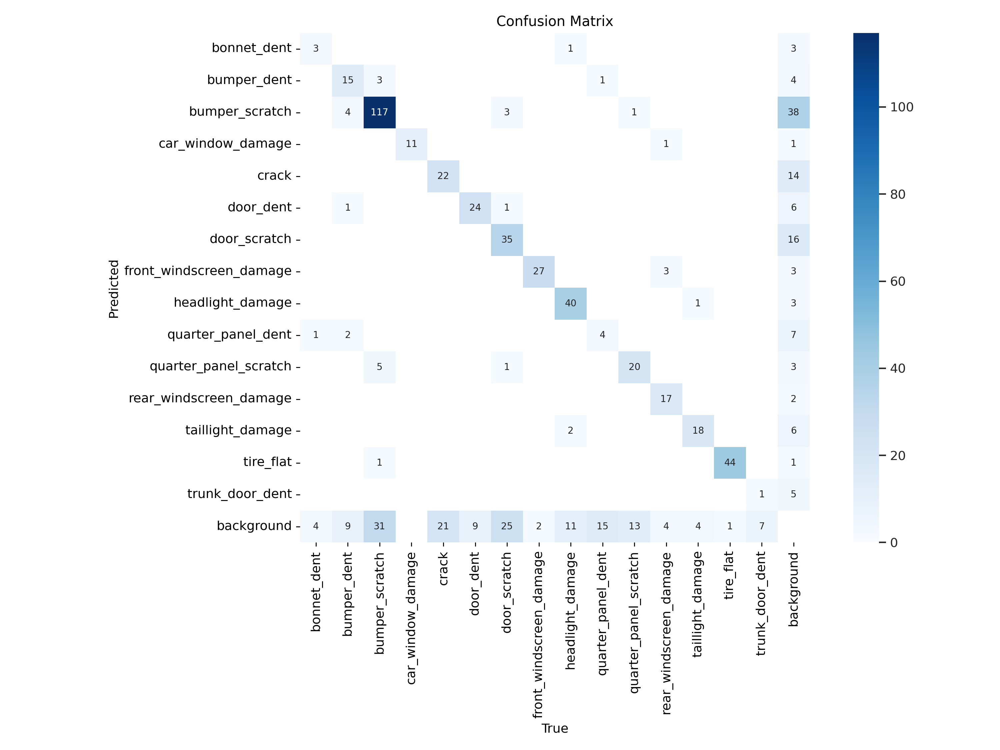

In [10]:
from IPython.display import Image

%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/confusion_matrix.png', width=600)

/kaggle/working


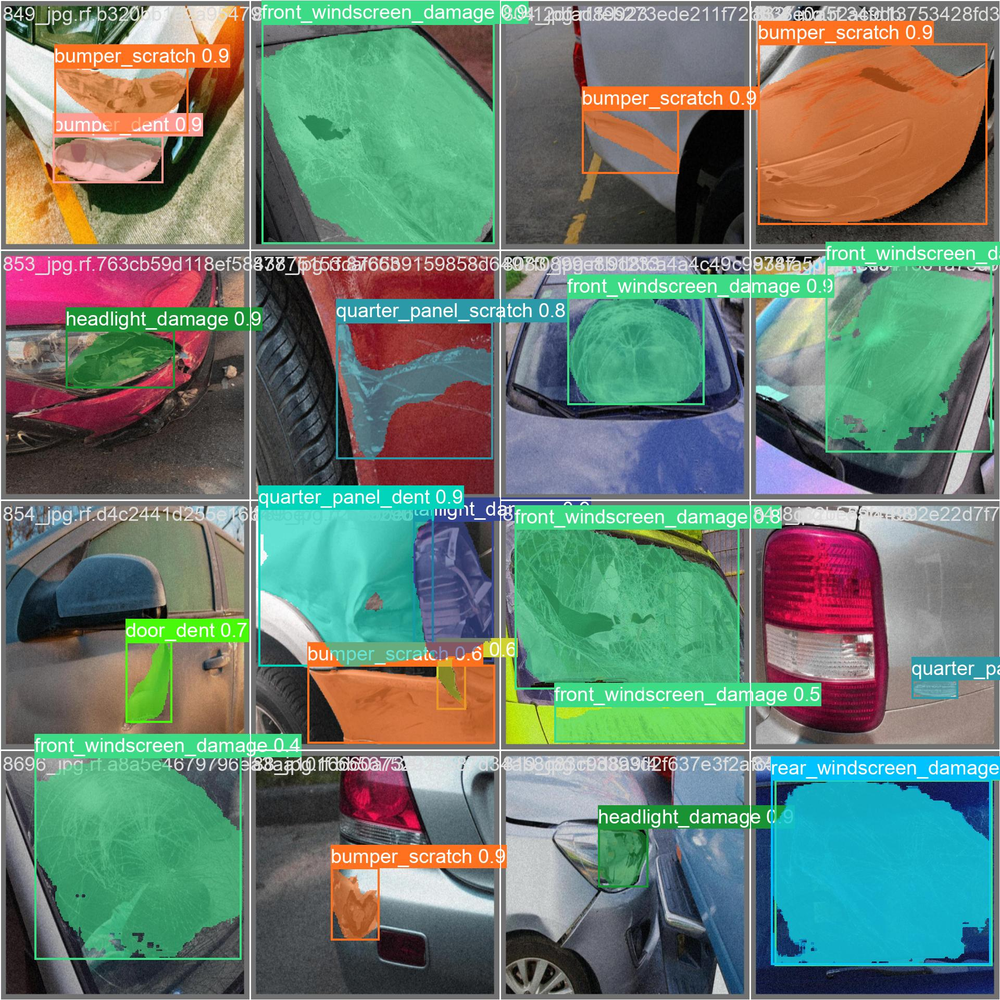

In [11]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/val_batch0_pred.jpg', width=600)

## Validate Model

In [12]:
%cd {HOME}

!yolo task=segment mode=val model={HOME}/runs/segment/train/weights/best.pt data={dataset.location}/data.yaml

/kaggle/working
Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
YOLOv8s-seg summary (fused): 195 layers, 11785405 parameters, 0 gradients, 42.5 GFLOPs
val: Scanning /kaggle/working/datasets/car-damage-detect-1/valid/labels.cache...
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        435        586      0.635      0.581       0.58       0.39      0.606      0.549      0.542      0.328
           bonnet_dent          4          8      0.319      0.375      0.192      0.113      0.321      0.375      0.192     0.0422
           bumper_dent         30         31      0.571      0.355       0.43      0.235      0.433      0.258      0.295        0.2
        bumper_scratch        126        157      0.714      0.652      0.713      0.395      0.697      0.599      0.634      0.268
     car_window_damage         11         11      0.795          1      0.932      0.707      0.807          1

## Run Prediction

In [13]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=true

/kaggle/working
Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
YOLOv8s-seg summary (fused): 195 layers, 11785405 parameters, 0 gradients, 42.5 GFLOPs

image 1/434 /kaggle/working/datasets/car-damage-detect-1/test/images/10068_jpg.rf.2a15bfbdf20dccbe9b40f6a78982f5fd.jpg: 640x640 1 rear_windscreen_damage, 10.2ms
image 2/434 /kaggle/working/datasets/car-damage-detect-1/test/images/1014_jpg.rf.cb679aa9ee4773e3b60dedb1340155ea.jpg: 640x640 1 bumper_scratch, 1 headlight_damage, 9.7ms
image 3/434 /kaggle/working/datasets/car-damage-detect-1/test/images/1024_jpg.rf.de65921e3c4dd99bac4509d5ea210c89.jpg: 640x640 1 door_dent, 1 tire_flat, 9.7ms
image 4/434 /kaggle/working/datasets/car-damage-detect-1/test/images/10255_jpg.rf.734d10e35516474311213fbe7f2f3df5.jpg: 640x640 1 front_windscreen_damage, 9.7ms
image 5/434 /kaggle/working/datasets/car-damage-detect-1/test/images/1051_jpg.rf.816f6f20e142eda12d64df0cf5f0216a.jpg: 640x640 1 bumper_scratch, 9.7ms


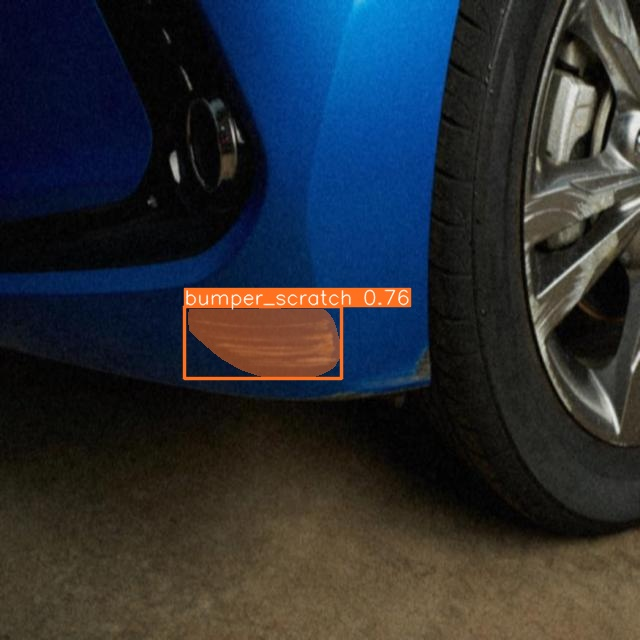

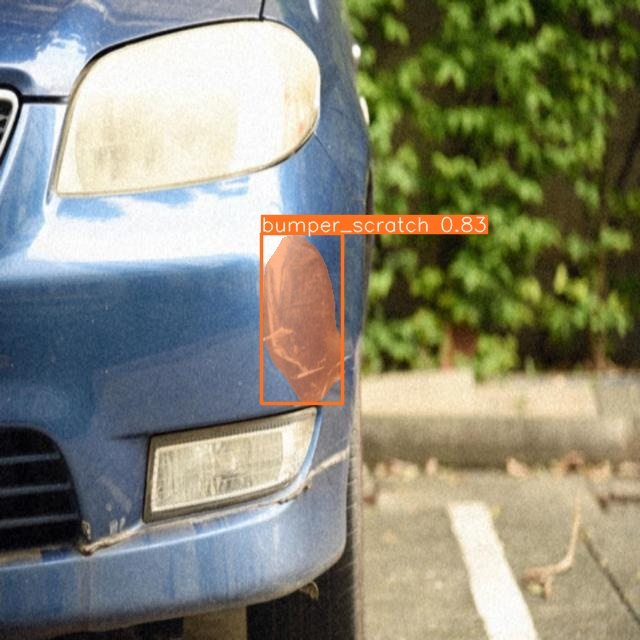

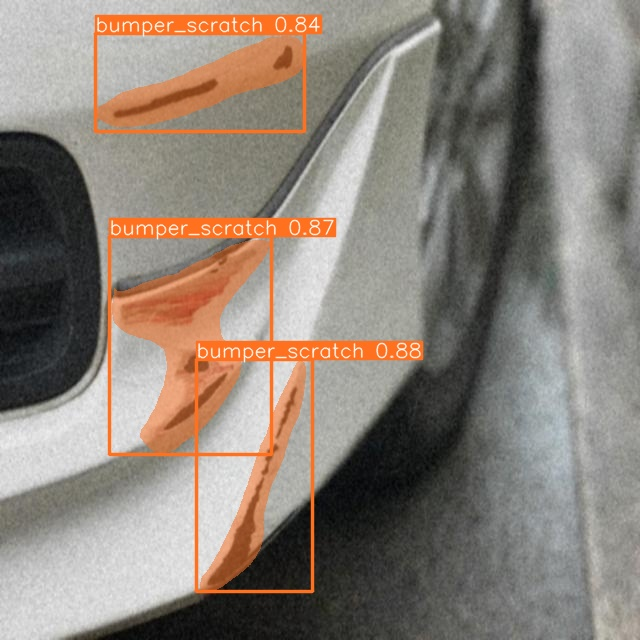

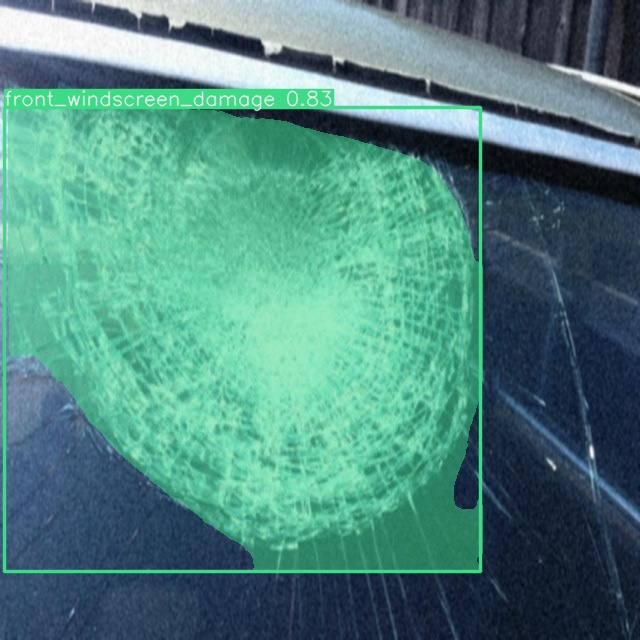

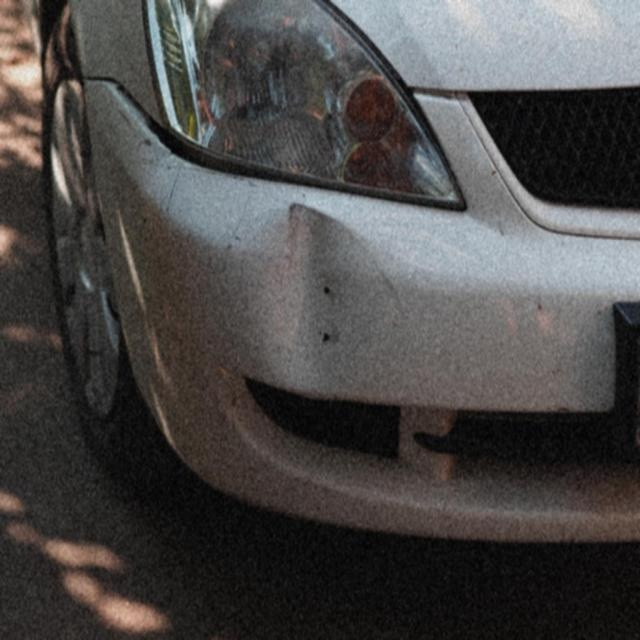

...

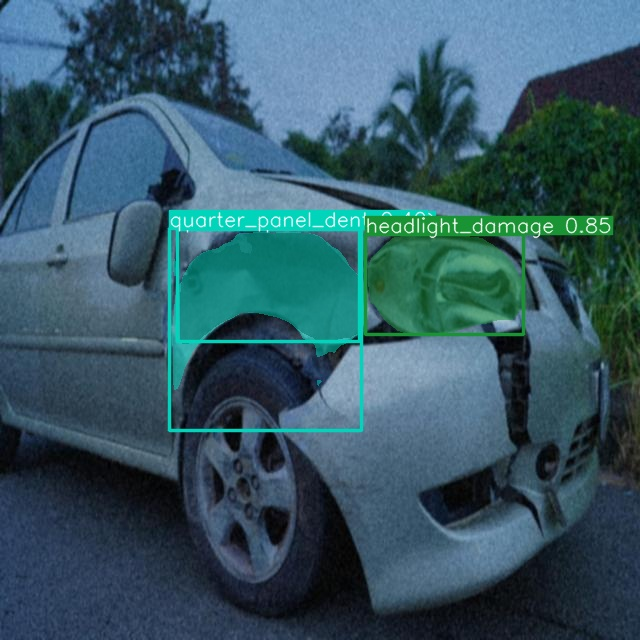

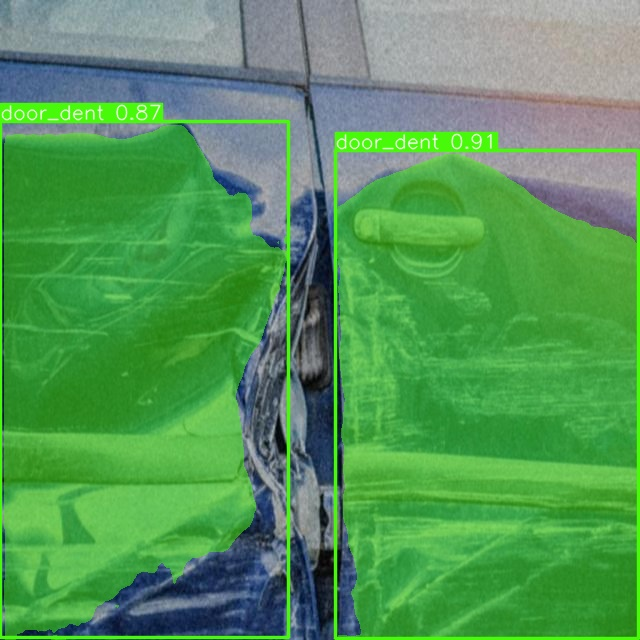

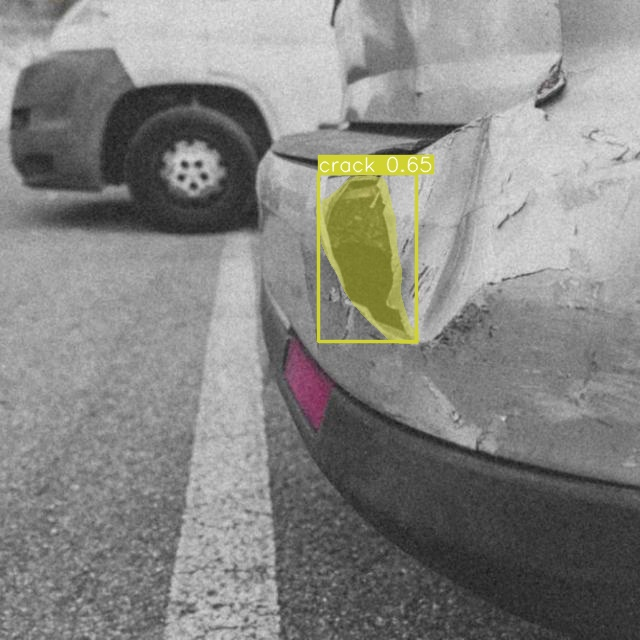

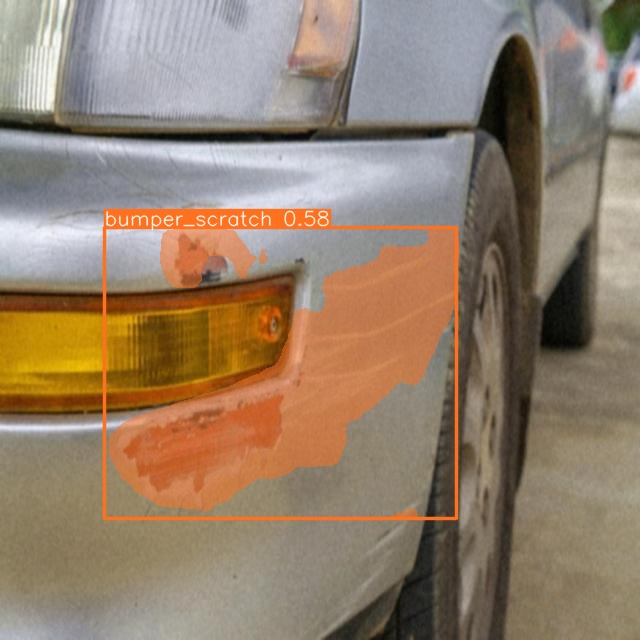

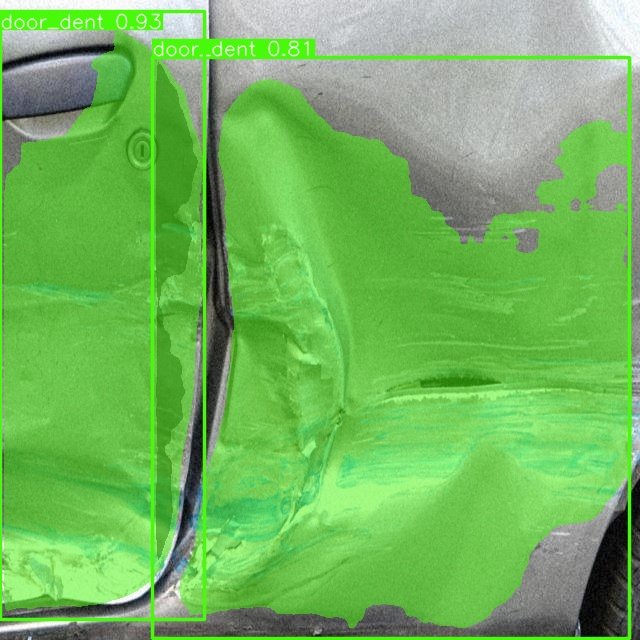

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/segment/predict/*.jpg'):
      display(Image(filename=image_path, height=600))
      print("\n")

## Convert Model to OONX Model

In [15]:
from ultralytics import YOLO
model = YOLO("/kaggle/working/runs/segment/train/weights/best.pt")  # load a custom trained model

# Export the model
model.export(format="onnx")

Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CPU (Intel Xeon 2.00GHz)
YOLOv8s-seg summary (fused): 195 layers, 11785405 parameters, 0 gradients, 42.5 GFLOPs

PyTorch: starting from '/kaggle/working/runs/segment/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 51, 8400), (1, 32, 160, 160)) (22.8 MB)

ONNX: starting export with onnx 1.16.1 opset 17...
ONNX: export success ✅ 2.0s, saved as '/kaggle/working/runs/segment/train/weights/best.onnx' (45.2 MB)

Export complete (5.2s)
Results saved to /kaggle/working/runs/segment/train/weights
Predict:         yolo predict task=segment model=/kaggle/working/runs/segment/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=segment model=/kaggle/working/runs/segment/train/weights/best.onnx imgsz=640 data=/kaggle/working/datasets/car-damage-detect-1/data.yaml  
Visualize:       https://netron.app


'/kaggle/working/runs/segment/train/weights/best.onnx'

In [16]:
import shutil
shutil.make_archive('/kaggle/working/runs', 'zip', '/kaggle/working/runs')

'/kaggle/working/runs.zip'